## Imports

In [5]:
import sys
import os
from PIL import Image, ImageDraw
import pathlib
import torch
import numpy as np

In [2]:
sys.path.append(next(pathlib.Path(os.getcwd()).joinpath('dlib').glob('dist/*.egg')).as_posix())
sys.path.append(pathlib.Path(os.getcwd(), 'face_recognition_models').as_posix())
sys.path.append(pathlib.Path(os.getcwd(), 'face_recognition').as_posix())

In [3]:
import face_recognition

## Recognition

### Annotating faces on an image

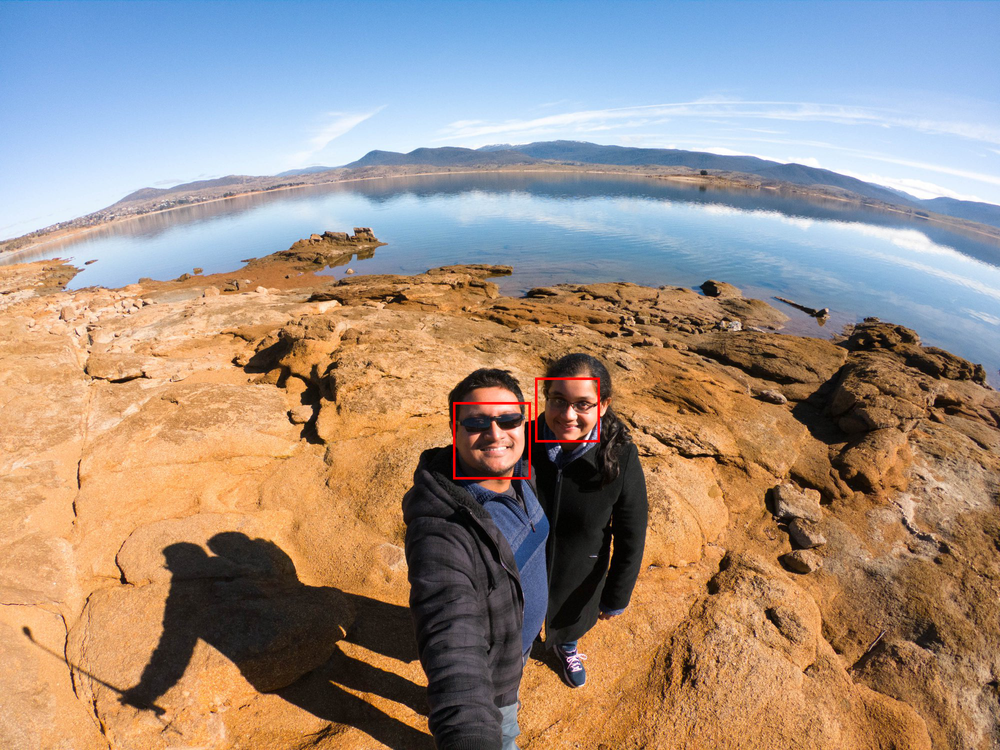

In [6]:
faces_both = face_recognition.face_locations(face_recognition.load_image_file('assets/me_viji.jpg'))
image_both = Image.open('assets/me_viji.jpg')
imagebb_both = ImageDraw.Draw(image_both)  

for (top, right, bottom, left) in faces_both:
    imagebb_both = ImageDraw.Draw(image_both) 
    shape = [left, top, right, bottom]
    imagebb_both.rectangle(shape, outline="red", width=5)
display(image_both)

In [19]:
faces_both

[(804, 1061, 958, 906), (755, 1199, 884, 1070)]

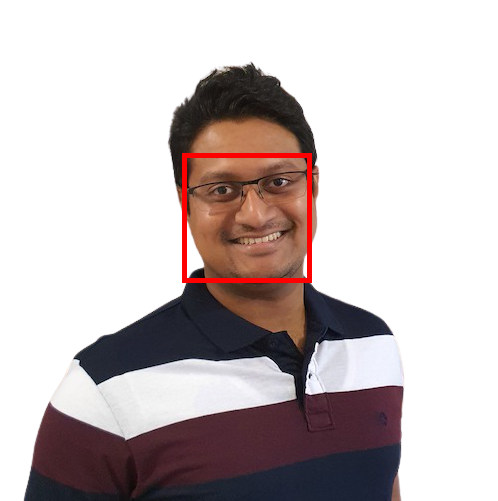

In [8]:
image_me = Image.open('assets/me.png')
faces_me = face_recognition.face_locations(face_recognition.load_image_file('assets/me.png'))
imagebb_me = ImageDraw.Draw(image_me)  

for (top, right, bottom, left) in faces_me:
    imagebb_me = ImageDraw.Draw(image_me) 
    shape = [left, top, right, bottom]
    imagebb_me.rectangle(shape, outline="red", width=5)
display(image_me)

### Using encodings of one face, searching for that image on another

In [9]:
encodings_me = face_recognition.face_encodings(np.array(image_me.convert('RGB')), faces_me)
encodings_both = face_recognition.face_encodings(np.array(image_both.convert('RGB')), faces_both)

In [13]:
np.linalg.norm(np.array(encodings_me) - np.array(encodings_both), axis=1)

array([0.43379593, 0.52081091])

In [16]:
is_me_flags = face_recognition.compare_faces(np.array(encodings_me), np.array(encodings_both), tolerance=0.5)

True
False


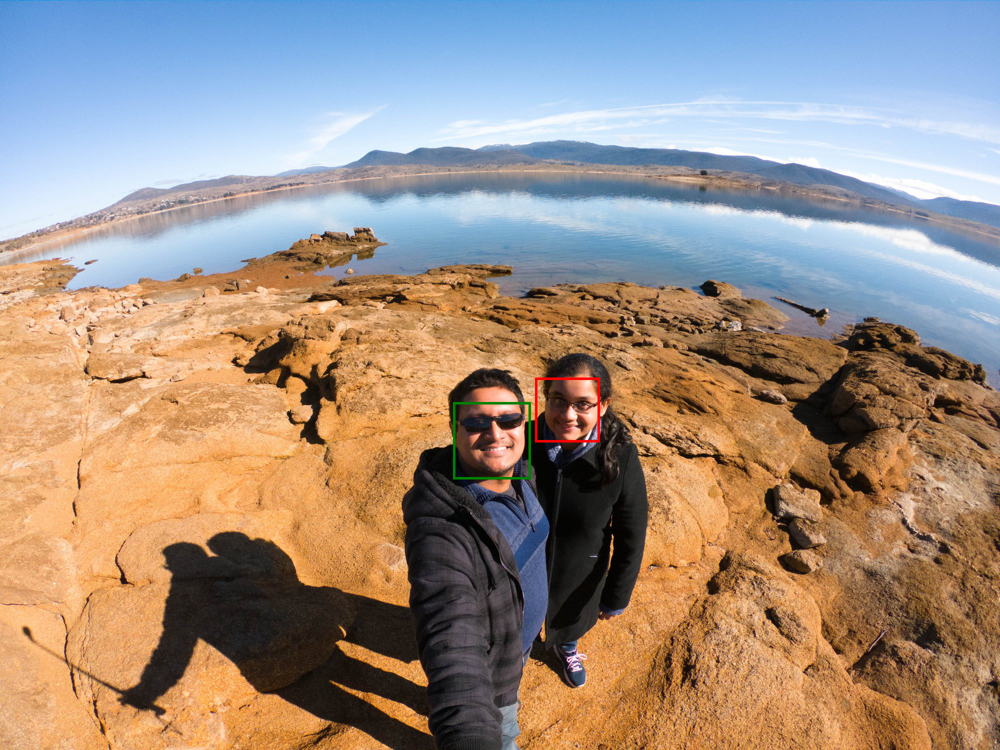

In [18]:
image_both_marked = Image.open('assets/me_viji.jpg')
imagebb_both_marked = ImageDraw.Draw(image_both)

for is_me, (top, right, bottom, left) in zip(is_me_flags, faces_both):
    print(is_me)
    imagebb_both_marked = ImageDraw.Draw(image_both_marked)
    shape = [left, top, right, bottom]
    imagebb_both_marked.rectangle(shape, outline="green" if is_me else "red", width=5)

display(image_both_marked)